# Image Processing using OpenCV



In [1]:
import numpy as np # common abbreviation

In [2]:
# common abbreviation
import matplotlib.pyplot as plt  

# jupyter notebook specific to have plots appear in the notebook
%matplotlib inline               

In [5]:
pip install opencv-python

   ---------------------------------------- 0.0/39.5 MB ? eta -:--:--
   --------------- ------------------------ 15.2/39.5 MB 73.6 MB/s eta 0:00:01
   ------------------------------------ --- 35.7/39.5 MB 87.2 MB/s eta 0:00:01
   ---------------------------------------- 39.5/39.5 MB 73.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
import cv2 # yes, we are using opencv version 

In [7]:
# code to find version of opencv
cv2.__version__

'4.11.0'

## Reading Image

In [8]:
# line 5:  def my_show(**kwargs) --> takes any "extra" keyword arguments and 
#                                    puts them in a dictionary named kwargs
# line 7:  ax.imshow(**kwargs)   --> takes kwargs (a dictionary) and 
#                                    "expands" them into keyword arguments to imshow
def my_show(ax, img, title=None, interpolation='bicubic', **kwargs):
    ' helper to display an image on an axes without grid/spine '
    ax.imshow(img, interpolation = interpolation, **kwargs)
    ax.axis('off')
    if title:
        ax.set_title(title)

def my_gshow(ax, img, title=None, cmap='my_gshowgray', interpolation='bicubic', **kwargs):
    ' helper to display an image, in grayscale, on an axes without grid/spine '
    my_show(ax, img, title=title, cmap='gray', interpolation=interpolation, **kwargs)

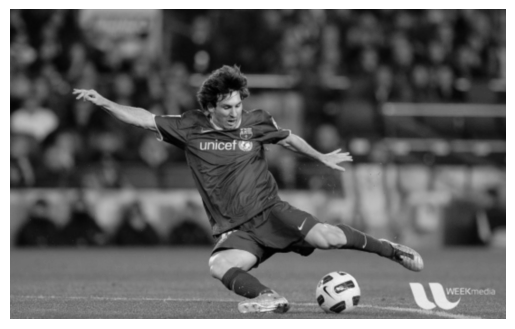

In [16]:
img_dir = './'
messi_gray = cv2.imread(img_dir+'image_dir\messi.jpg', 0)
my_gshow(plt.gca(), messi_gray) # use the default axes for quick-and-dirty

In [17]:
#Find the shape of the image
img = cv2.imread(img_dir+'image_dir/messi.jpg') # default here is RGB
img.shape

(342, 548, 3)

<class 'numpy.ndarray'> (342, 548, 3) uint8


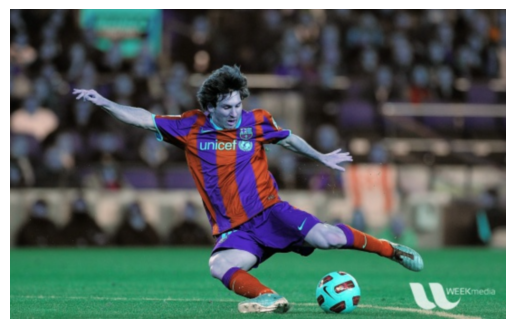

In [18]:
messi_color = cv2.imread(img_dir+'image_dir/messi.jpg') # default flag is 1 "color"

print(type(messi_color), 
      messi_color.shape, 
      messi_color.dtype)

my_show(plt.gca(), messi_color)
# FAIL:  mishmash of colors

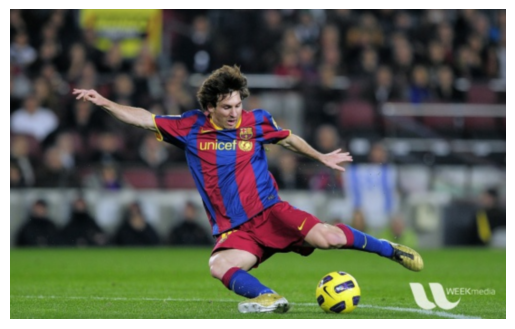

In [19]:
# opencv is GBR; matplotlib is RGB.  
my_show(plt.gca(), messi_color[:,:,::-1]) # walk last axis in opposite order (we'll never do this again!)

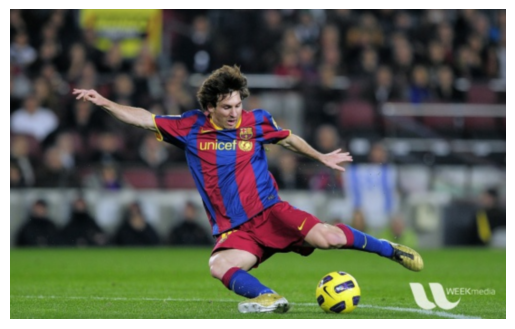

In [20]:
# better: explicitly convert the image to RGB
messi_rgb = cv2.cvtColor(messi_color, cv2.COLOR_BGR2RGB)
my_show(plt.gca(), messi_rgb)

## Functions for these exercise

In [21]:
import matplotlib.pyplot as plt
import cv2

def my_show(ax, img, title=None, interpolation='bicubic', **kwargs):
    ''' helper to display an image on an axes without grid/spine '''
    ax.imshow(img, interpolation = interpolation, **kwargs)
    ax.axis('off')
    if title:
        ax.set_title(title)

def my_gshow(ax, img, title=None, cmap='gray', interpolation='bicubic', **kwargs):
    ''' helper to display an image, in grayscale, on an axes without grid/spine '''
    my_show(ax, img, title=title, cmap='gray', interpolation=interpolation, **kwargs)

def my_read_g(filename):
    ''' read from an image file to an rgb '''
    gray = cv2.imread(filename, 0)
    return gray

# these come up frequently.  we'll always want rgb (instead of bgr)
# and we often need both rgb and grayscale (grayscale starts many processing steps)
def my_read(filename):
    ''' read from an image file to an rgb '''
    img = cv2.imread(filename)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def my_read_cg(filename):
    ''' read from an image file to an rgb and a grayscale image array '''
    rgb = my_read(filename)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    return rgb, gray

# now we can do this:
messi_rgb = my_read(img_dir+'image_dir/messi.jpg')

# or if we need both
messi_rgb, messi_gray = my_read_cg(img_dir+'image_dir/messi.jpg')


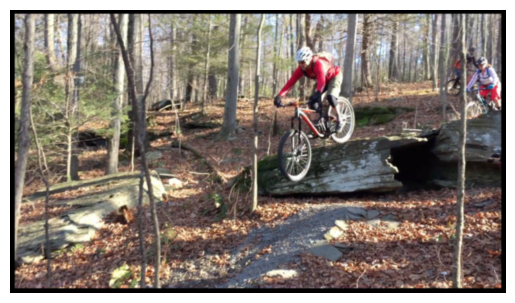

In [22]:
# Docs at:
# https://docs.opencv.org/3.0-beta/modules/core/doc/operations_on_arrays.html#copymakeborder
# make sure you find the opencv 3 docs

outdoors = my_read(img_dir+'image_dir/farm-drop.jpg')
with_border = cv2.copyMakeBorder(outdoors, 20,20,20,20,cv2.BORDER_CONSTANT)
my_show(plt.gca(), with_border)

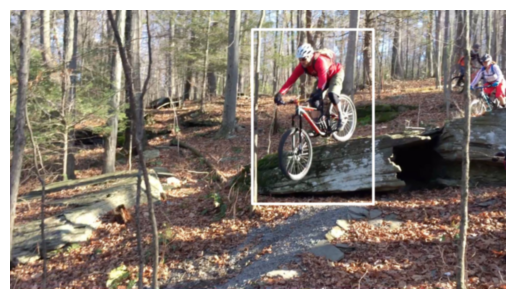

In [23]:
# we'll learn about drawing, this is another option to track down
# your region of interest (ROI)
marked_up = cv2.rectangle(outdoors, (1000,80), (1500, 800), (255,255,255), 10)
my_show(plt.gca(), marked_up)

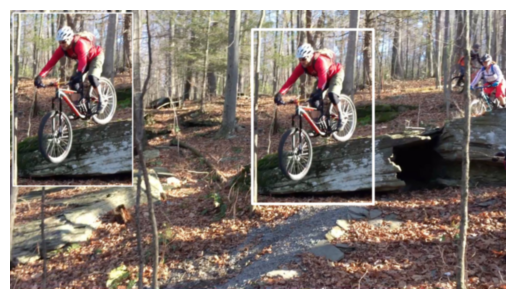

In [24]:
# duplicate the ROI in another part of the image
roi = marked_up[81:800, 1001:1500]
shape = roi.shape
marked_up[10:10+shape[0],10:10+shape[1]] = roi
my_show(plt.gca(), marked_up)

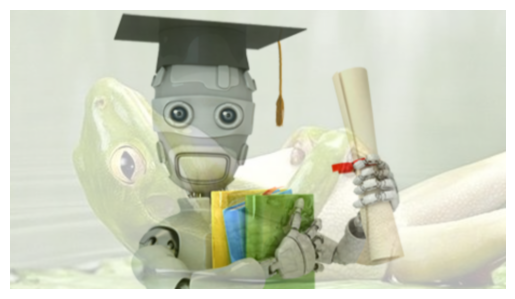

In [25]:
img_dir=img_dir+'image_dir/'
ml   = my_read(img_dir+'/ml.png')
frog = my_read(img_dir+'/frog.jpg')

min_r, min_c = (min(ml.shape[0], frog.shape[0]), 
                min(ml.shape[1], frog.shape[1]))

# blending of two images:
# by:  img1 * wgt1 + img2 * wgt2 + wgt3
#      addWeights(img1, wgt1, img2, wgt2, wgt3)
dst = cv2.addWeighted(  ml[:min_r, :min_c], 0.7,
                      frog[:min_r, :min_c], 0.3, 0)
my_show(plt.gca(), dst)

In [26]:
# place logo in corner of messi
logo, messi = map(my_read, [img_dir+'/opencv-logo.png', img_dir+'/messi.jpg'])

# technique for creating slices programmatically
# i.e., create code that does indexing/slicing in arr[:, a:b, :c]
shape = logo.shape[:-1]
corner = [slice(0,n) for n in shape] + [slice(None)]  # fancy:  [:logo.shape[0], :logo.shape[1], :]
print(corner)

[slice(0, 240, None), slice(0, 195, None), slice(None, None, None)]


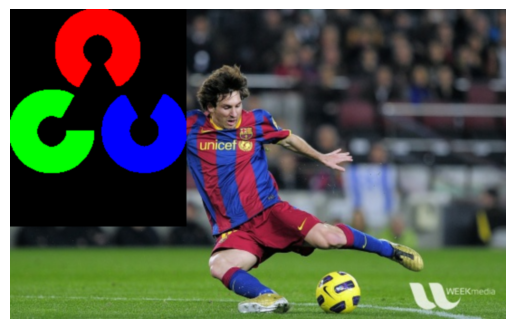

In [27]:
messi[tuple(corner)] = logo
my_show(plt.gca(), messi)

In [28]:
flags = [i for i in dir(cv2) if i.startswith('COLOR_')]
print (flags)

['COLOR_BAYER_BG2BGR', 'COLOR_BAYER_BG2BGRA', 'COLOR_BAYER_BG2BGR_EA', 'COLOR_BAYER_BG2BGR_VNG', 'COLOR_BAYER_BG2GRAY', 'COLOR_BAYER_BG2RGB', 'COLOR_BAYER_BG2RGBA', 'COLOR_BAYER_BG2RGB_EA', 'COLOR_BAYER_BG2RGB_VNG', 'COLOR_BAYER_BGGR2BGR', 'COLOR_BAYER_BGGR2BGRA', 'COLOR_BAYER_BGGR2BGR_EA', 'COLOR_BAYER_BGGR2BGR_VNG', 'COLOR_BAYER_BGGR2GRAY', 'COLOR_BAYER_BGGR2RGB', 'COLOR_BAYER_BGGR2RGBA', 'COLOR_BAYER_BGGR2RGB_EA', 'COLOR_BAYER_BGGR2RGB_VNG', 'COLOR_BAYER_GB2BGR', 'COLOR_BAYER_GB2BGRA', 'COLOR_BAYER_GB2BGR_EA', 'COLOR_BAYER_GB2BGR_VNG', 'COLOR_BAYER_GB2GRAY', 'COLOR_BAYER_GB2RGB', 'COLOR_BAYER_GB2RGBA', 'COLOR_BAYER_GB2RGB_EA', 'COLOR_BAYER_GB2RGB_VNG', 'COLOR_BAYER_GBRG2BGR', 'COLOR_BAYER_GBRG2BGRA', 'COLOR_BAYER_GBRG2BGR_EA', 'COLOR_BAYER_GBRG2BGR_VNG', 'COLOR_BAYER_GBRG2GRAY', 'COLOR_BAYER_GBRG2RGB', 'COLOR_BAYER_GBRG2RGBA', 'COLOR_BAYER_GBRG2RGB_EA', 'COLOR_BAYER_GBRG2RGB_VNG', 'COLOR_BAYER_GR2BGR', 'COLOR_BAYER_GR2BGRA', 'COLOR_BAYER_GR2BGR_EA', 'COLOR_BAYER_GR2BGR_VNG', 'COLOR_

In [29]:
def track_blue(frame):
    #Convert the input image to HSV 
    # Convert BGR to HSV
    hsv = cv2.cvtColor(frame, cv2.COLOR_RGB2HSV)
    
    # define range of blue color in HSV - Create in BGR and ... 
    rgb_blue = np.array([0,0,255]).astype(np.uint8).reshape(1,1,-1)
    # Convert BGR to HSV
    hsv_blue_mid = cv2.cvtColor(rgb_blue, cv2.COLOR_RGB2HSV)
    h_blue,_,_ = hsv_blue_mid.flatten()

    # Prepare the range to create the mask.
    lwr_blue = np.array([h_blue-10,  50,  50]).astype(np.uint8)
    upr_blue = np.array([h_blue+10, 255, 255]).astype(np.uint8)

    # Threshold the HSV image to get only blue colors
    mask = cv2.inRange(hsv, lwr_blue, upr_blue)

    # Bitwise-AND mask and original image
    res = cv2.bitwise_and(frame, frame, mask=mask)
    return res

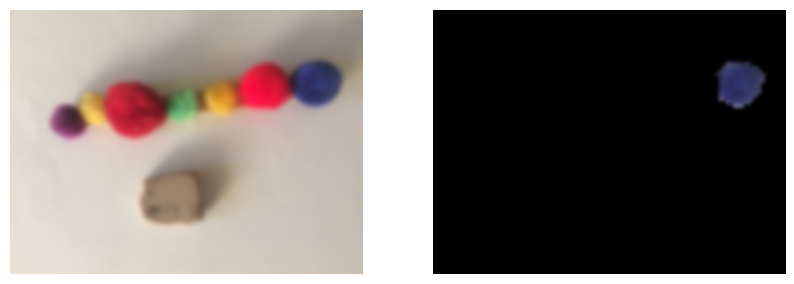

In [30]:
#Load a image and then mask with the blue color.
colorful = my_read(img_dir+"/fuzzyballs2.png")
selected = track_blue(colorful)

#Ploy the original image, mask and resulting image.
fig, axes = plt.subplots(1,2,figsize=(10,5))
my_show(axes[0], colorful)
my_show(axes[1], selected)


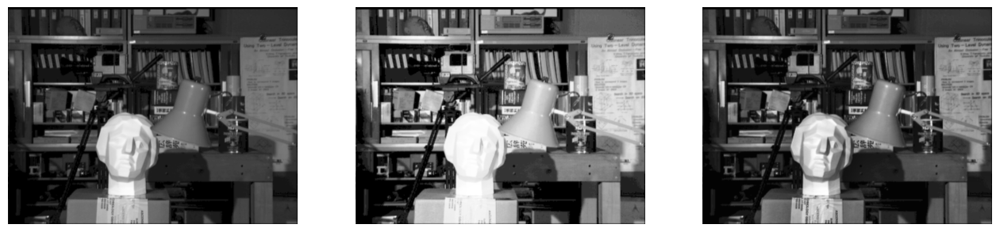

In [31]:
# histogram normalization makes low values lower and high values higher
# --> outliers *get worse*!

# contrast limited adaptive hist. equal.
multi = my_read_g(img_dir+'/tsukuba.png')
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_equal = clahe.apply(multi)

global_equal = cv2.equalizeHist(multi)

fig,axes = plt.subplots(1,3,figsize=(16,4))

other_args = {"vmin":0, "vmax":255, 'cmap':'gray'}
my_show(axes[0], multi, **other_args)
my_show(axes[1], global_equal, **other_args)
my_show(axes[2], clahe_equal,  **other_args)

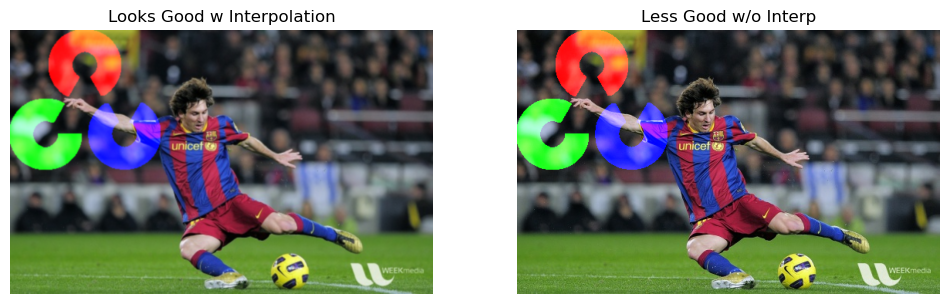

In [32]:
# let's be more subtle
logo, messi = map(my_read, [img_dir+'/opencv-logo.png', img_dir+'/messi.jpg'])
logo_fg = np.where(logo > 0)

fig, axes = plt.subplots(1,2,figsize=(12,6))

messi[logo_fg] = logo[logo_fg]
my_show(axes[0], messi, title="Looks Good w Interpolation")
my_show(axes[1], messi, interpolation=None, title="Less Good w/o Interp")

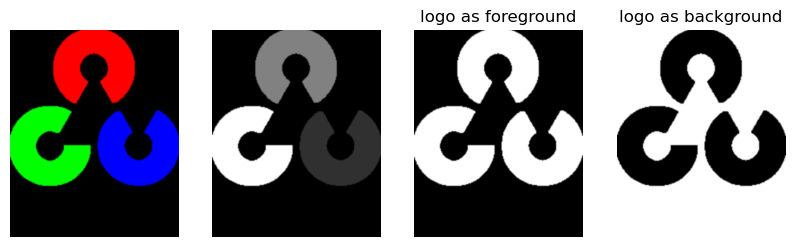

In [33]:
logo  = my_read(img_dir+'/opencv-logo.png')
messi = my_read(img_dir+'/messi.jpg')


# Create the grey scale version of the image and masks with the thresholding
logo_gray = cv2.cvtColor(logo,cv2.COLOR_RGB2GRAY)
ret, mask = cv2.threshold(logo_gray, 10, 255, cv2.THRESH_BINARY)
mask_inv  = cv2.bitwise_not(mask)

fig, axes = plt.subplots(1,4,figsize=(10,4))

my_show(axes[0], logo)
my_gshow(axes[1], logo_gray)
my_gshow(axes[2], mask, title='logo as foreground')
my_gshow(axes[3], mask_inv, title='logo as background')

In [34]:
messi_roi = messi[:logo.shape[0], :logo.shape[1]]

In [35]:
print(messi_roi.shape, mask_inv.shape, sep='\n')

(240, 195, 3)
(240, 195)


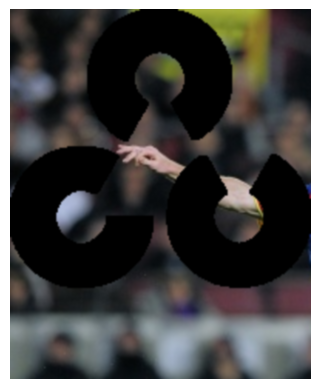

In [36]:
# create image as background + foreground

# background is messi where there isn't logo

# create background from messi
# logo  "on" --> messi off --> drop messi pixel
# logo "off" --> messi on  --> grab messi pixel

# this is convenient, compared to logical ops with array and mask of different kinds
# mask-ed points go to zero
bg = cv2.bitwise_and(messi_roi, messi_roi, mask=mask_inv)
my_show(plt.gca(), bg)

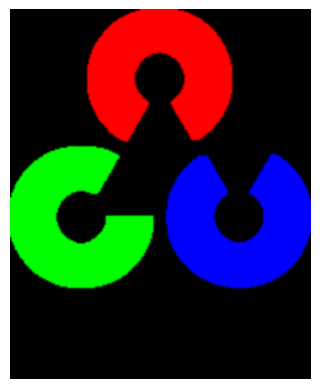

In [37]:
# foreground is from the logo
# logo 'on' --> want this pixel
fg = cv2.bitwise_and(logo, logo, mask=mask)
my_show(plt.gca(), fg)

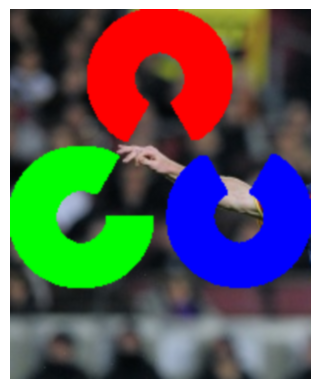

In [38]:
# pretty direct ... only one pixel from fg/bg is "on" at any given position
# b/c of our masking
combined = cv2.add(bg, fg)
my_show(plt.gca(), combined)

In [39]:
# compare to:
(logo>10).shape  # this is channel by channel

(240, 195, 3)

In [40]:
# so, let's get that effect without having to convert channels:
active_roi = (logo>10).any(axis=2)
silent_roi = np.logical_not(active_roi)
active_roi.shape

(240, 195)

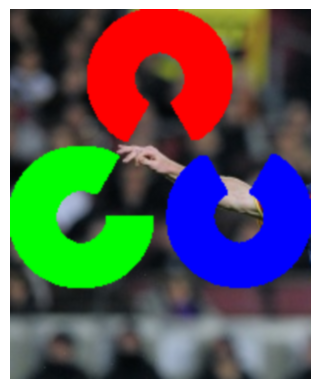

In [41]:
# alternative to np.newaxis:  np.expand_dims(mask_inv, -1)
fg = np.bitwise_and(logo, mask[:,:,np.newaxis])
bg = np.bitwise_and(messi_roi, mask_inv[:,:,np.newaxis])
combined = cv2.add(bg, fg)
my_show(plt.gca(), combined)

In [42]:
#Utility function to resize images.
def size_me(img):
    ' given 80dpi, find size of image in inches from pixel dims '
    dpi = 80
    height, width, *depth = img.shape
    figsize = width / float(dpi), height / float(dpi)
    return figsize

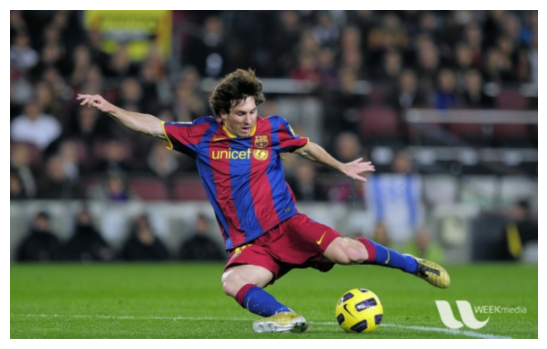

In [43]:
messi = my_read(img_dir+'/messi.jpg')
fig, ax = plt.subplots(1,1,figsize=size_me(messi))
my_show(ax, messi)

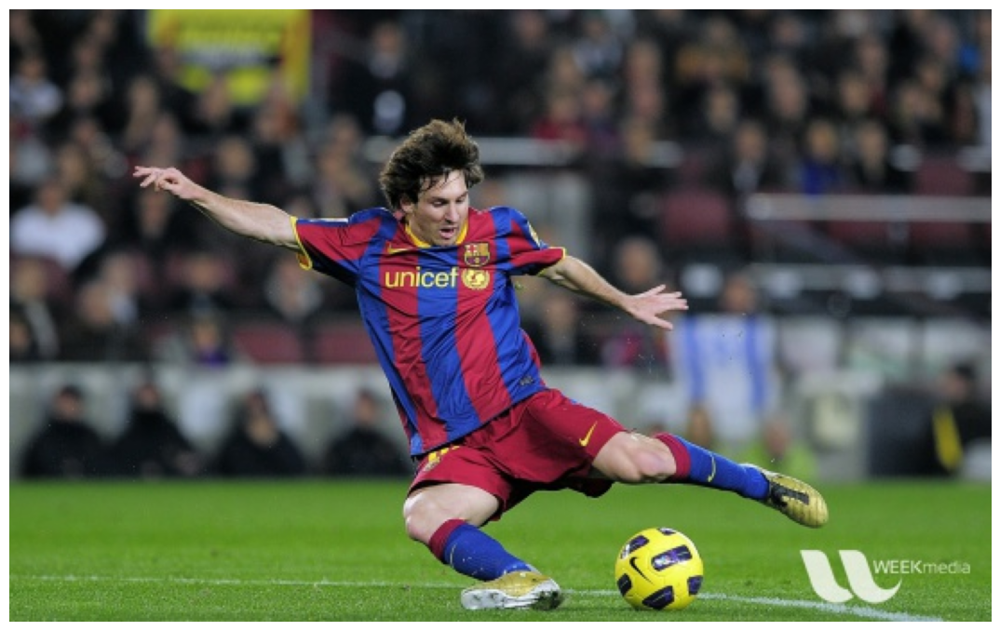

In [44]:
# zoom in (make bigger)
res = cv2.resize(messi, None, fx=2, fy=2, interpolation = cv2.INTER_AREA)
# slight use of matlab style api to avoid plt.subplots(1,1,...) call for just one axis 
plt.figure(figsize=size_me(res)) 
my_show(plt.gca(), res);

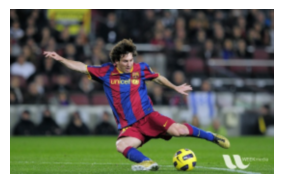

In [45]:
# zoom out (make smaller)
height, width = messi.shape[:2]
res = cv2.resize(messi, (int(.5*width), int(.5*height)), interpolation=cv2.INTER_LINEAR)

plt.figure(figsize=size_me(res))
my_show(plt.gca(), res)

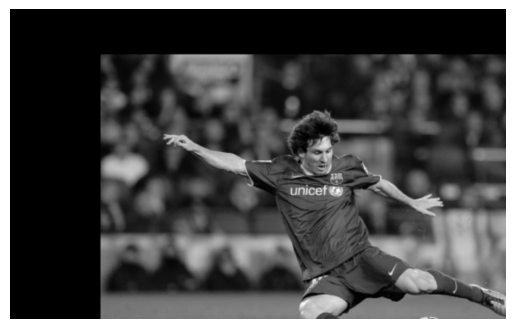

In [46]:
messi_gray = my_read_g(img_dir+'/messi.jpg')

height, width = messi_gray.shape   # r,c -> x,y

x_shift, y_shift = 100, 50  

M = np.array([[1, 0, x_shift],
              [0, 1, y_shift]], dtype=np.float32)
res = cv2.warpAffine(messi_gray, M, (width, height)) # arguments in x,y terms

my_show(plt.gca(), res, cmap='gray')

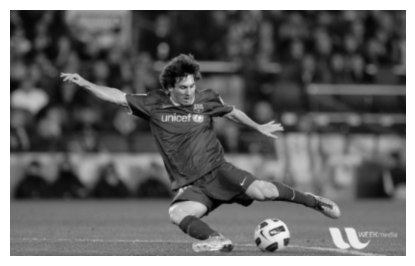

In [47]:
messi_gray = my_read_g(img_dir+'/messi.jpg')

height, width = messi_gray.shape   # r,c -> x,y

scale_factor = 0.75

M = np.array([[scale_factor, 0, 0],
              [0, scale_factor, 0]], dtype=np.float32)
res = cv2.warpAffine(messi_gray, M, (int(width * scale_factor), 
                                     int(height * scale_factor))) # arguments in x,y terms

plt.figure(figsize=size_me(res))
my_show(plt.gca(), res, cmap='gray')

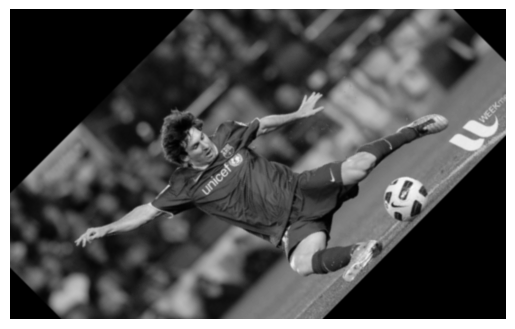

In [48]:
M = cv2.getRotationMatrix2D((width/2,height/2), 45, 1)
res = cv2.warpAffine(messi_gray, M, (width, height)) # args in xy terms (not rc terms)
my_show(plt.gca(), res, cmap='gray')

It is possible to define an affine transform by definine three before and after points.  With three points before and after a transform, the affine matrix can be inferred.

[[1.  0.  0. ]
 [0.5 0.5 0. ]]


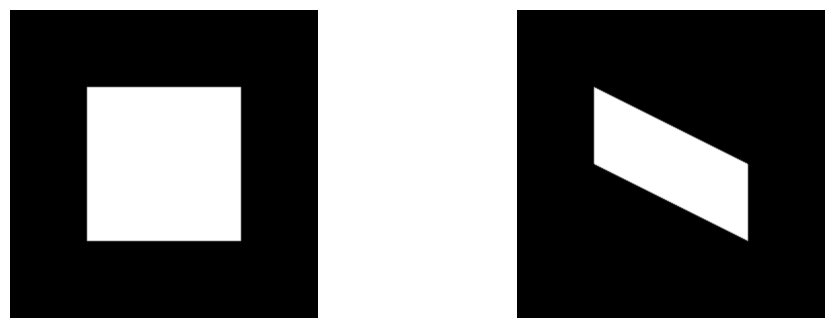

In [49]:
shape = (300,300)
orig = np.zeros(shape, dtype=np.uint8)
orig[75:225, 75:225] = 255

# NOTE:  play around with these to get a feel for what they do!
# args in xy terms (not rc terms)
pts1 = np.float32([[75,75], [75,225], [225,225]])
pts2 = np.float32([[75,75], [75,150], [225,225]])
M = cv2.getAffineTransform(pts1,pts2)
res = cv2.warpAffine(orig, M, shape)

print(M)

fig,axes = plt.subplots(1,2,figsize=(12,4))
my_show(axes[0], orig, cmap='gray')
my_show(axes[1], res, cmap='gray')

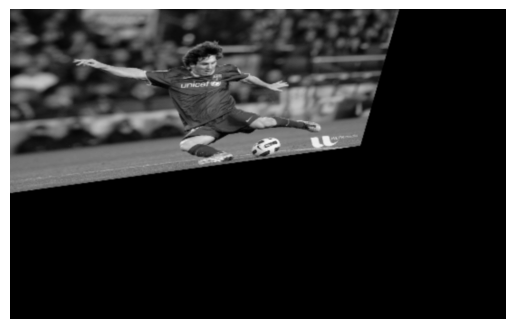

In [50]:
# perspective transform:  straight lines -> straight lines

# pts in r,c terms (:sadface:)
rows, cols = messi_gray.shape
pts1 = np.float32([[0,0],[rows-1,0], [0,cols-1], [rows-1, cols-1]])
pts2 = np.float32([[0,0],[300,0],[0,300],[250,250]])

M = cv2.getPerspectiveTransform(pts1,pts2)
res = cv2.warpPerspective(messi_gray, M, (cols, rows)) # r,c -> x,y terms

my_show(plt.gca(), res, cmap='gray')

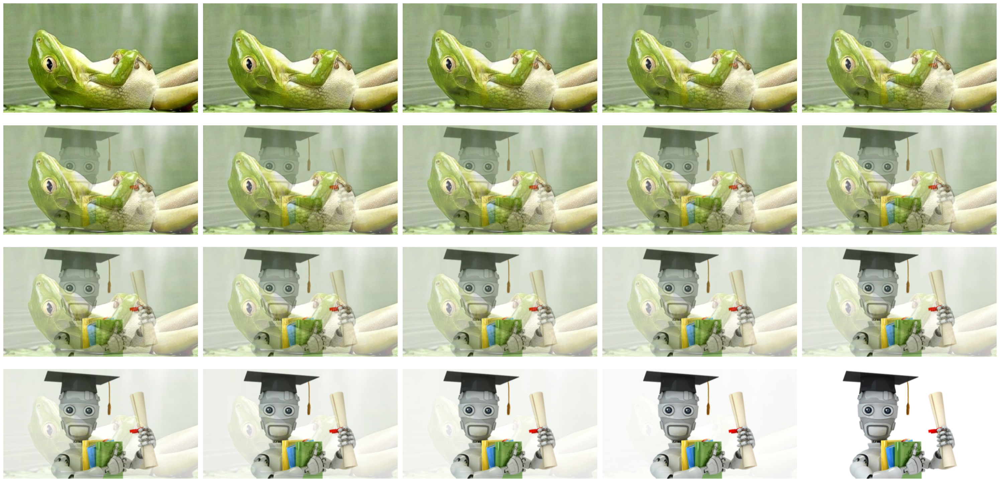

In [51]:
ml   = my_read(img_dir+'/ml.png')
frog = my_read(img_dir+'/frog.jpg')

min_r, min_c = (min(ml.shape[0], frog.shape[0]), 
                min(ml.shape[1], frog.shape[1]))

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(30,15))
axes = axes.flat
wgts = np.linspace(0.0,1.0,20)
for ax, wgt in zip(axes, wgts):
    dst = cv2.addWeighted(  ml[:min_r, :min_c], wgt,
                          frog[:min_r, :min_c], 1-wgt, 0)
    my_show(ax, dst)
fig.tight_layout()

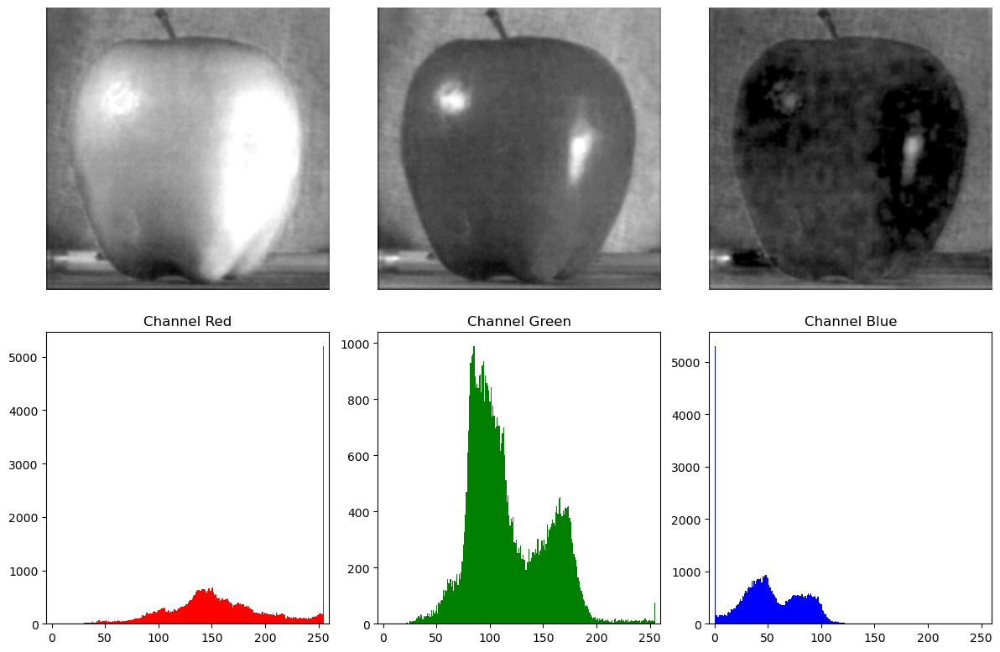

In [53]:
fig, axes = plt.subplots(2,3,figsize=(12,8))
fig.tight_layout()

apple = my_read(img_dir+'/apple.png')
for idx, color in enumerate(['Red', 'Green', 'Blue']):
    my_gshow(axes[0,idx], apple[:,:,idx])
    
    hist = cv2.calcHist([apple],[idx],None,[256],[0,256])

    axes[1,idx].hist(range(256), weights=hist, bins=256, color = color)
    axes[1,idx].set_title("Channel {}".format(color))
    axes[1,idx].set_xlim([-5,260]) # make sure we can see 0 and 255  

[160 100 100] [ 20 255 255]
[  0 100 100] [179 255 255]


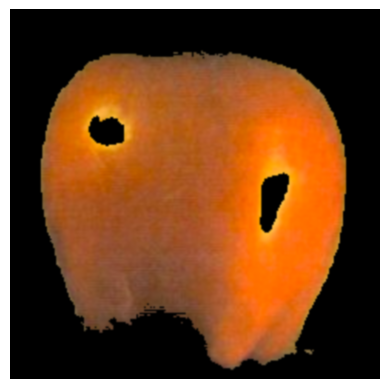

In [54]:
def cv2_rgb_to_hsv(rgb):
    ' use cv2 to convert an rgb value to an hsv value '
    rgb = rgb.reshape(1,1,-1)             # ugly, fake a 1 pixel image
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)[0,0] # undo "fake" image
    return hsv

def inrange_hsv(img, h, span):
    # the range we tolerate for s and v
    sv_lw, sv_up = 100,255  
    h_lwr, h_upr = (h - span) % 180, (h + span) % 180
    
    lwr = np.uint8([h_lwr, sv_lw, sv_lw])
    upr = np.uint8([h_upr, sv_up, sv_up])

    print(lwr, upr)
    
    # near 0/180 ... have to split the range
    if h_lwr > h_upr: 
        bot = np.uint8([0, sv_lw, sv_lw])
        top = np.uint8([179, sv_up, sv_up])
        
        print(bot, top)
        
        in1 = cv2.inRange(img, bot, upr)
        in2 = cv2.inRange(img, lwr, top)
        
        mask = cv2.bitwise_or(in1, in2)
    # keep the simple case simple
    else:
        mask = cv2.inRange(img, lwr, upr)
        
    return mask
 
apple = my_read(img_dir+'/apple.png')
apple_hsv = cv2.cvtColor(apple, cv2.COLOR_RGB2HSV)

red_hsv = cv2_rgb_to_hsv(np.uint8([255,0,0]))

mask = inrange_hsv(apple_hsv, red_hsv[0], 20)
roi = cv2.bitwise_and(apple, apple, mask=mask)
my_show(plt.gca(), roi)